# Lab 4

Daniel Alfredo Rayo Roldán

Gerardo Pineda Riveiro

https://github.com/DanielRasho/DS-Lab4

In [1]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from datetime import date
import openeo

In [ ]:
import json
tiempo = ["2025-01-01", "2025-03-31"]
AmatitlanGeo = {}
AtitlanGeo = {}

# Read first file
with open("./data/Lago_Amatitlan.geojson", "r", encoding="utf-8") as f:
    AmatitlanGeo = json.load(f)

# Read second file
with open("./data/Lago_Atitlan.geojson", "r", encoding="utf-8") as f:
    AtitlanGeo = json.load(f)

## Descarga de datos

Los datos utilizados son capturas del Sentinal 2 entre enero y marzo de 2025, para ello se conecto a la API utilizando *openeo* para obtener capturas hechas por el sátelite en ese rango.

In [3]:
connection = openeo.connect("https://openeo.dataspace.copernicus.eu").authenticate_oidc()

Authenticated using refresh token.


#### Datos de Amatitlán

In [ ]:
amatitlan_graph = connection.load_collection(
    "SENTINEL2_L2A",
    spatial_extent=AmatitlanGeo,
    temporal_extent=tiempo,
)

result_graph = amatitlan_graph.save_result(format="GTIFF")

job = connection.create_job(result_graph)
job.start_and_wait()
job.download_results("./data/GIS/cianobacteria_amatitlan-2023.tif")

#### Datos Atitlán

In [ ]:
atitlan_graph = connection.load_collection(
    "SENTINEL2_L2A",
    spatial_extent=AtitlanGeo,
    temporal_extent=tiempo,
)

atitlan_result_graph = atitlan_graph.save_result(format="GTIFF")

job = connection.create_job(atitlan_graph)
job.start_and_wait()
job.download_results("./data/GIS/cianobacteria_atitlan.tif")

## Selección de imagenes para análisis

Después de la descarga se obtuvieron 37 capturas del lago Atitlan y 19 del lago de Amatitlán. Sin embargo un pequeña inspección previa reveló que algunas imagenes se encontraban cortadas, debido a que el satélite no inspeccionó el area completa, o directamente la captura fue hecha en un día con alta nubosidad imposibilitando completamente observar los lagos. Por ello a continuación se imprimió todas las capturas y se seleccionó solo aquellas que mostraban los lagos completamente y con poca nubosidad.

GeoTIFFs encontrados:
 - openEO_2025-01-03Z.tif
 - openEO_2025-01-08Z.tif
 - openEO_2025-01-13Z.tif
 - openEO_2025-01-18Z.tif
 - openEO_2025-01-23Z.tif
 - openEO_2025-01-28Z.tif
 - openEO_2025-02-02Z.tif
 - openEO_2025-02-07Z.tif
 - openEO_2025-02-12Z.tif
 - openEO_2025-02-17Z.tif
 - openEO_2025-02-22Z.tif
 - openEO_2025-02-27Z.tif
 - openEO_2025-03-04Z.tif
 - openEO_2025-03-09Z.tif
 - openEO_2025-03-14Z.tif
 - openEO_2025-03-19Z.tif
 - openEO_2025-03-24Z.tif
 - openEO_2025-03-26Z.tif
 - openEO_2025-03-29Z.tif


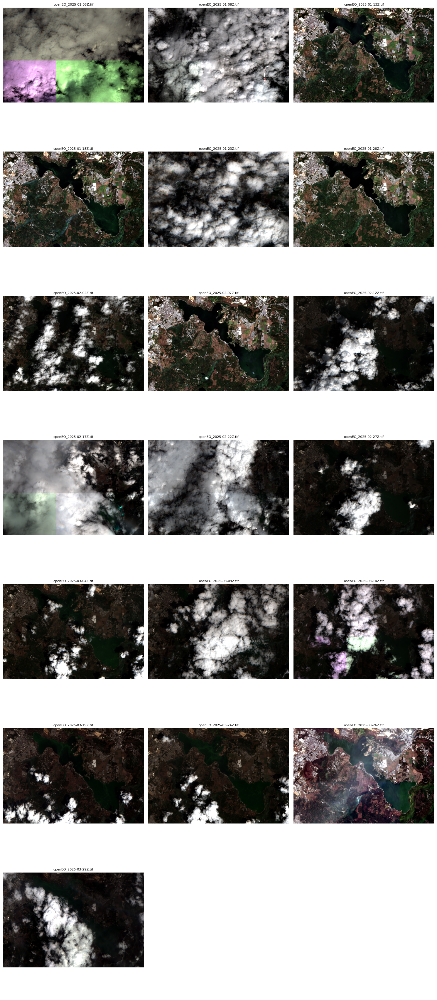

In [1]:
import re
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from pathlib import Path

base = Path("data/Amatitlan")
tifs = sorted(base.glob("*.tif"))

print("GeoTIFFs encontrados:")
for p in tifs:
    print(" -", p.name)

def find_band_idx(names, target):
    for i, n in enumerate(names, start=1):
        if not n:
            continue
        if re.search(fr"\b{target}\b", n, flags=re.IGNORECASE):
            return i
    return None

def stretch(img):
    p2, p98 = np.percentile(img[~np.isnan(img)], [2, 98])
    return np.clip((img - p2) / (p98 - p2 + 1e-6), 0, 1)

# Store RGB or single-band previews
previews = []
titles = []

for tif_path in tifs:
    with rasterio.open(tif_path) as ds:
        desc = ds.descriptions
        arr = ds.read()

    if arr.shape[0] >= 3:
        r_i = find_band_idx(desc, "B04") or 4
        g_i = find_band_idx(desc, "B03") or 3
        b_i = find_band_idx(desc, "B02") or 2

        rgb = np.dstack([
            stretch(arr[r_i-1].astype(np.float32)),
            stretch(arr[g_i-1].astype(np.float32)),
            stretch(arr[b_i-1].astype(np.float32))
        ])
        previews.append(rgb)
    else:
        single_band = arr[0]
        vmin, vmax = np.nanpercentile(single_band, [2, 98])
        previews.append((single_band, vmin, vmax))  # Keep scaling params for later

    titles.append(tif_path.name)

# Plot in a 3-column grid
cols = 3
rows = int(np.ceil(len(previews) / cols))
fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < len(previews):
        data = previews[i]
        if isinstance(data, tuple):  # Single band
            ax.imshow(data[0], vmin=data[1], vmax=data[2], cmap="gray")
        else:  # RGB
            ax.imshow(data)
        ax.set_title(titles[i], fontsize=8)
        ax.axis("off")
    else:
        ax.axis("off")  # Hide empty subplot

plt.tight_layout()
plt.show()


GeoTIFFs encontrados (37):
 - openEO_2025-01-01Z.tif
 - openEO_2025-01-03Z.tif
 - openEO_2025-01-06Z.tif
 - openEO_2025-01-08Z.tif
 - openEO_2025-01-11Z.tif
 - openEO_2025-01-13Z.tif
 - openEO_2025-01-16Z.tif
 - openEO_2025-01-18Z.tif
 - openEO_2025-01-21Z.tif
 - openEO_2025-01-23Z.tif
 - openEO_2025-01-26Z.tif
 - openEO_2025-01-28Z.tif
 - openEO_2025-01-31Z.tif
 - openEO_2025-02-02Z.tif
 - openEO_2025-02-05Z.tif
 - openEO_2025-02-07Z.tif
 - openEO_2025-02-10Z.tif
 - openEO_2025-02-12Z.tif
 - openEO_2025-02-15Z.tif
 - openEO_2025-02-17Z.tif
 - openEO_2025-02-20Z.tif
 - openEO_2025-02-22Z.tif
 - openEO_2025-02-25Z.tif
 - openEO_2025-02-27Z.tif
 - openEO_2025-03-02Z.tif
 - openEO_2025-03-04Z.tif
 - openEO_2025-03-07Z.tif
 - openEO_2025-03-09Z.tif
 - openEO_2025-03-12Z.tif
 - openEO_2025-03-14Z.tif
 - openEO_2025-03-17Z.tif
 - openEO_2025-03-19Z.tif
 - openEO_2025-03-22Z.tif
 - openEO_2025-03-24Z.tif
 - openEO_2025-03-26Z.tif
 - openEO_2025-03-27Z.tif
 - openEO_2025-03-29Z.tif


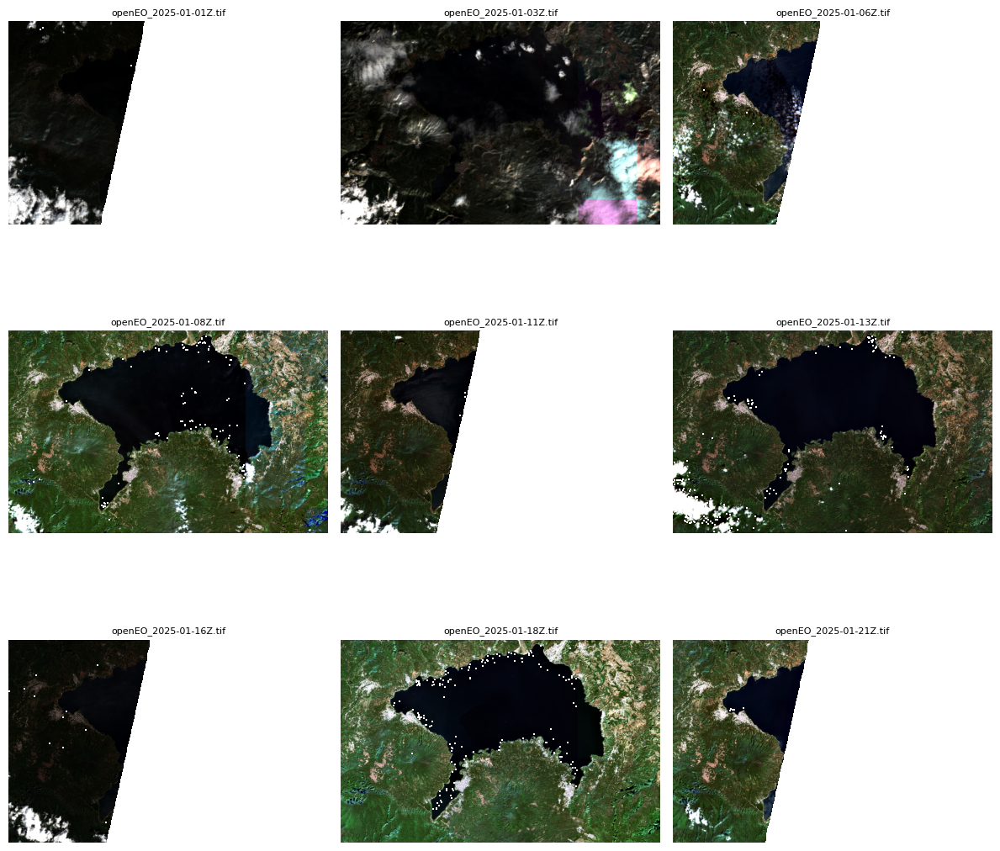

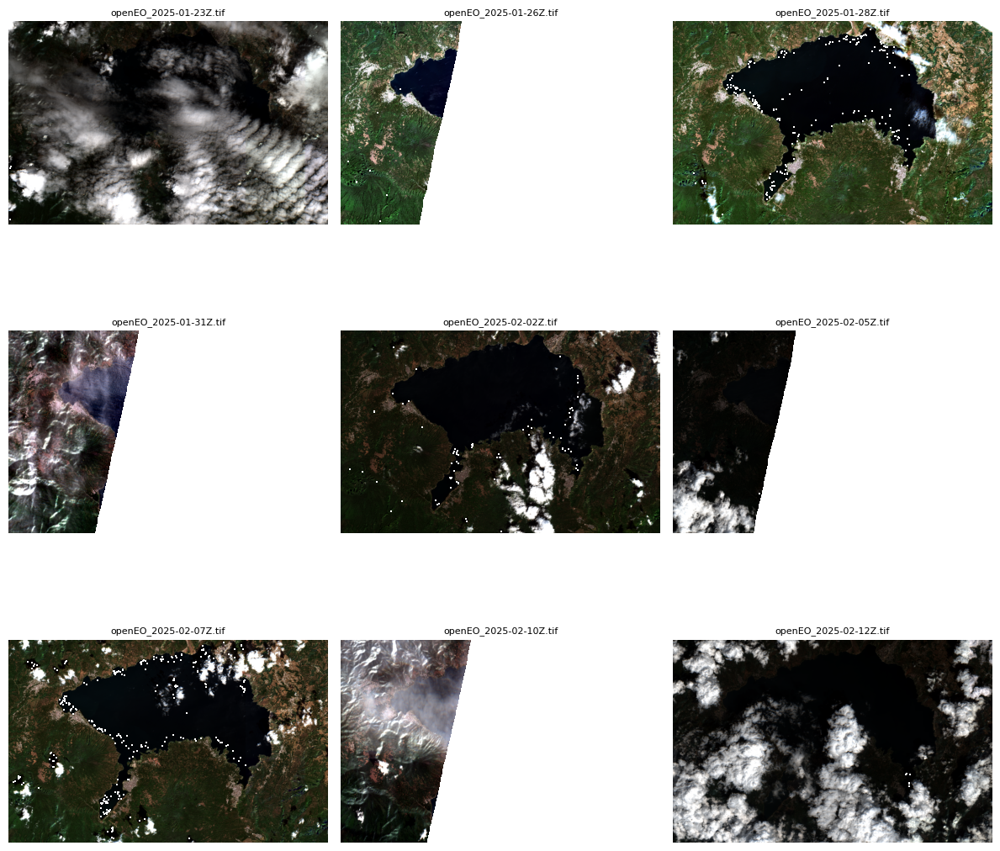

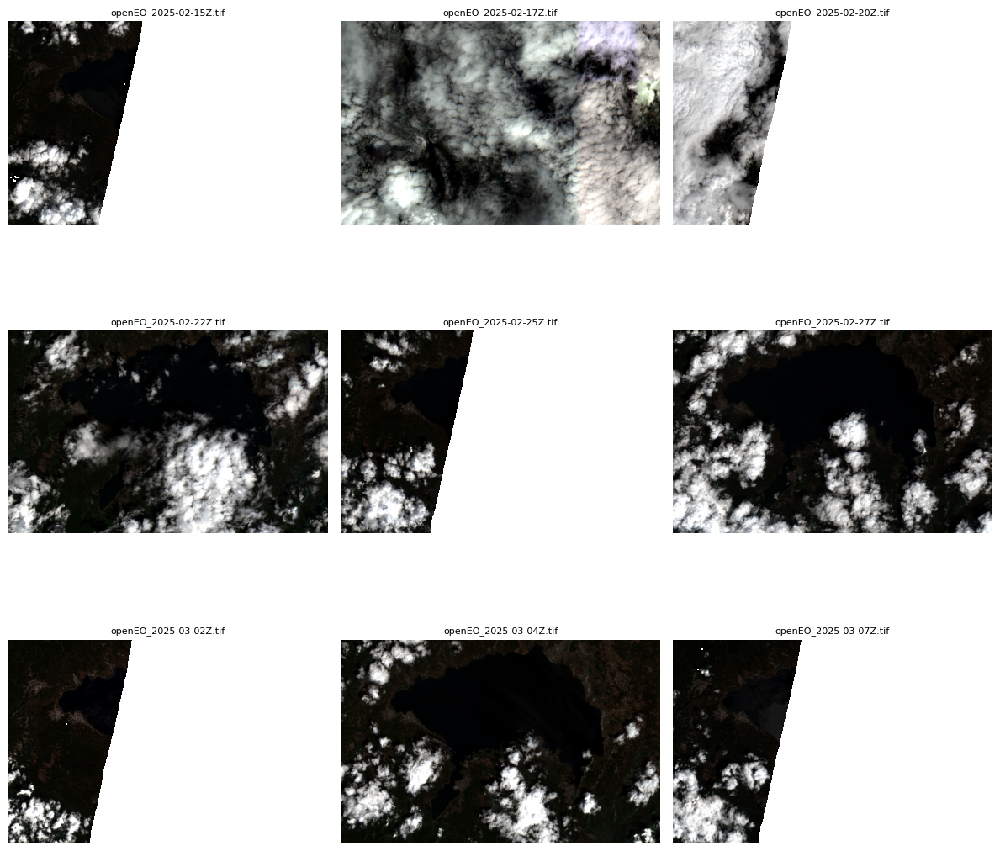

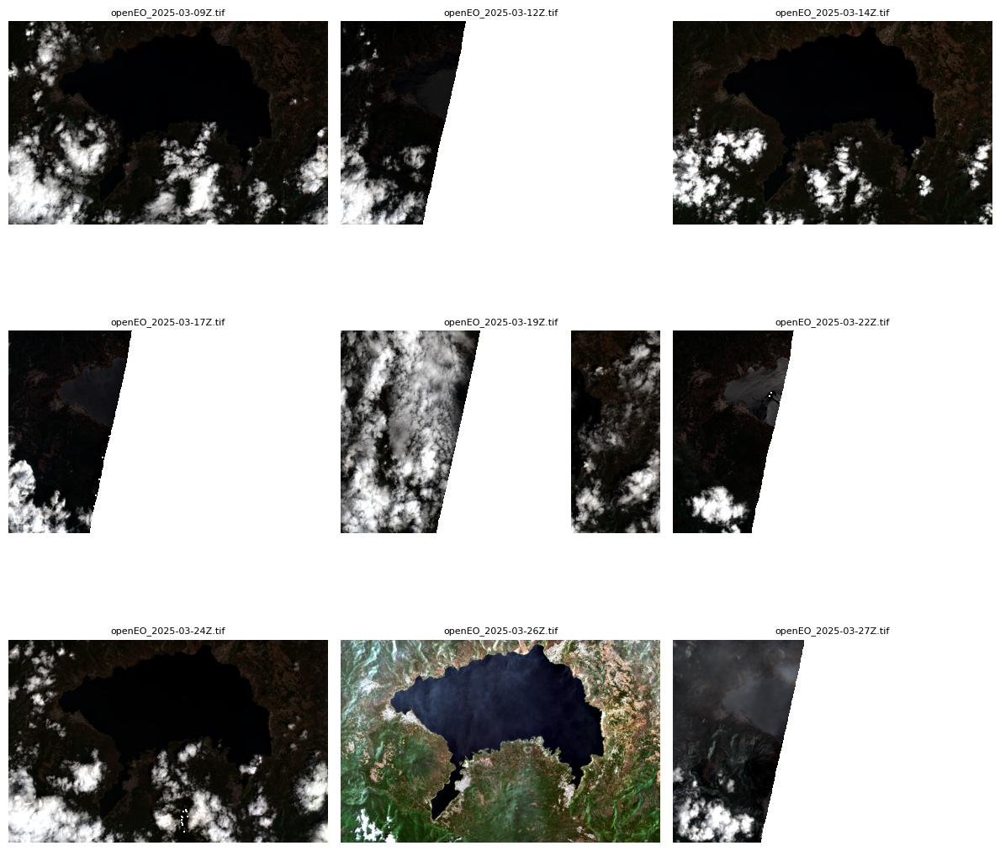

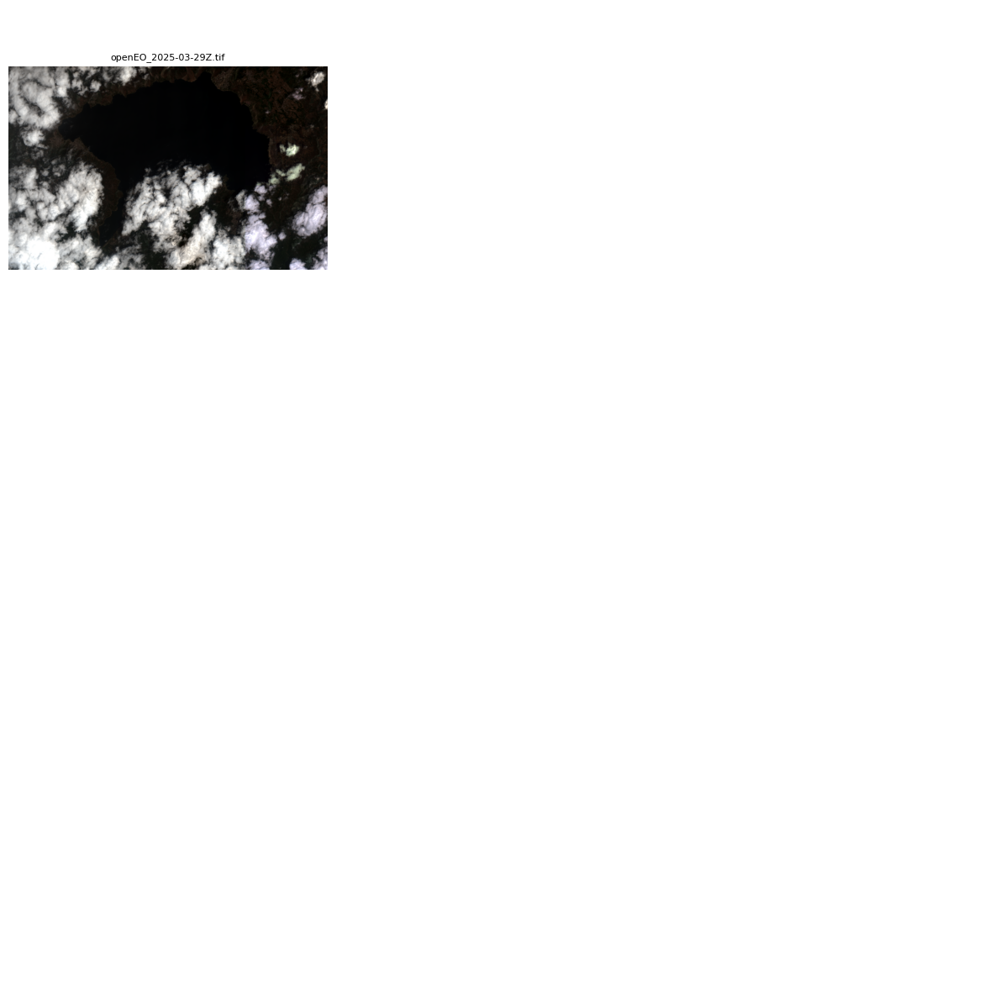

In [1]:
import re
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from pathlib import Path

base = Path("data/Atitlan")
tifs = sorted(base.glob("*.tif"))

print(f"GeoTIFFs encontrados ({len(tifs)}):")
for p in tifs:
    print(" -", p.name)

def find_band_idx(names, target):
    for i, n in enumerate(names, start=1):
        if not n:
            continue
        if re.search(fr"\b{target}\b", n, flags=re.IGNORECASE):
            return i
    return None

def stretch(img):
    p2, p98 = np.percentile(img[~np.isnan(img)], [2, 98])
    return np.clip((img - p2) / (p98 - p2 + 1e-6), 0, 1)

batch_size = 9  # 3x3 grid per batch

for batch_start in range(0, len(tifs), batch_size):
    batch = tifs[batch_start:batch_start + batch_size]

    fig, axes = plt.subplots(3, 3, figsize=(12, 12))
    axes = axes.flatten()

    for ax, tif_path in zip(axes, batch):
        with rasterio.open(tif_path) as ds:
            desc = ds.descriptions
            arr = ds.read()

        if arr.shape[0] >= 3:
            r_i = find_band_idx(desc, "B04") or 4
            g_i = find_band_idx(desc, "B03") or 3
            b_i = find_band_idx(desc, "B02") or 2

            rgb = np.dstack([arr[r_i-1], arr[g_i-1], arr[b_i-1]]).astype(np.float32)
            rgb = np.stack([stretch(rgb[...,0]),
                            stretch(rgb[...,1]),
                            stretch(rgb[...,2])], axis=-1)

            ax.imshow(rgb)
        else:
            ax.imshow(arr[0], vmin=np.nanpercentile(arr[0], 2), vmax=np.nanpercentile(arr[0], 98), cmap='gray')

        ax.set_title(tif_path.name, fontsize=8)
        ax.axis("off")

    # Hide unused axes if batch < 9
    for ax in axes[len(batch):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()
    plt.close(fig)  # free memory

Esta sería la lista de imagenes válidas que se realmente utilizarón para secciones siguiente: 

In [ ]:
atitlan_valid_img = [
    "openEO_2025-01-08.tif",
    "openEO_2025-01-13.tif",
    "openEO_2025-01-18.tif",
    "openEO_2025-01-28.tif",
    "openEO_2025-02-02.tif",
    "openEO_2025-02-07.tif",
    "openEO_2025-03-26.tif",
]

amatitlan_valid_img = [
    "openEO_2025-01-13Z.tif",
    "openEO_2025-01-18Z.tif",
    "openEO_2025-01-28Z.tif",
    "openEO_2025-02-07Z.tif",
    "openEO_2025-03-26Z.tif"
]

## Análisis Temporal